In [0]:
#Task 0 (0 pts). Load the netflix titles dataset from https://msuweb.montclair.edu/~dongb/misc/netflix_titles.csv

In [0]:
!pip install geopandas descartes
# Import required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import geopandas as gpd
from mpl_toolkits.axes_grid1 import make_axes_locatable
import matplotlib.ticker as ticker
import math

# Specify the URL where the CSV file is located
url = 'https://msuweb.montclair.edu/~dongb/misc/netflix_titles.csv'

# Read the CSV file from the specified URL and store it in the netflix_titles DataFrame
netflix_titles = pd.read_csv(url)

# Display the netflix_titles DataFrame to check that the data has been loaded correctly
display(netflix_titles)

You should consider upgrading via the '/local_disk0/.ephemeral_nfs/envs/pythonEnv-99d3c92a-1970-4a18-a50a-0c6fd45b5a2d/bin/python -m pip install --upgrade pip' command.


show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,null,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmmaker Kirsten Johnson stages his death in inventive and comical ways to help them both face the inevitable."
s2,TV Show,Blood & Water,null,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",null,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Action & Adventure","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s4,TV Show,Jailbirds New Orleans,null,null,null,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series."
s5,TV Show,Kota Factory,null,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV Comedies","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",null,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe."
s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, Sofia Carson, Liza Koshy, Ken Jeong, Elizabeth Perkins, Jane Krakowski, Michael McKean, Phil LaMarr",null,"September 24, 2021",2021,PG,91 min,Children & Family Movies,"Equestria's divided. But a bright-eyed hero believes Earth Ponies, Pegasi and Unicorns should be pals — and, hoof to heart, she’s determined to prove it."
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri","United States, Ghana, Burkina Faso, United Kingdom, Germany, Ethiopia","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s9,TV Show,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Hollywood",United Kingdom,"September 24, 2021",2021,TV-14,9 Seasons,"British TV Shows, Reality TV","A talented batch of amateur bakers face off in a 10-week competition, whipping up their best dishes in the hopes of being named the U.K.'s best."
s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, Timothy Olyphant, Daveed Diggs, Skyler Gisondo, Laura Harrier, Rosalind Chao, 

In [0]:
#Task 1 - Data Cleaning

In [0]:
#Task 1.1 - The duration column describes the length of the movie/show. The rule is as follows: if it is a movie, the duration is described in #the number of minutes; if it is a TV show, it is described in the number of seasons. Find the records that do not follow the rule.

In [0]:
# Filter out rows where the "duration" column does not follow the expected format for movies and TV shows As well as filter out rows where duration is null or NaN
invalid_duration = netflix_titles[((netflix_titles["type"] == "Movie") & ((netflix_titles["duration"].str.contains("min$") == False)|(netflix_titles["duration"].isnull()))) | ((netflix_titles["type"] == "TV Show") & ((netflix_titles["duration"].str.contains("Seasons$") == False) & (netflix_titles["duration"].str.contains("Season$") == False)| (netflix_titles["duration"].isnull())))]

# Display the rows of the resulting DataFrame
display(invalid_duration)

show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
s5542,Movie,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,"April 4, 2017",2017,74 min,null,Movies,"Louis C.K. muses on religion, eternal love, giving dogs drugs, email fights, teachers and more in a live performance from Washington, D.C."
s5795,Movie,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,"September 16, 2016",2010,84 min,null,Movies,"Emmy-winning comedy writer Louis C.K. brings his caustic wit to Milwaukee, offering up his unique and uncensored take on sex, parenting and more."
s5814,Movie,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,"August 15, 2016",2015,66 min,null,Movies,"The comic puts his trademark hilarious/thought-provoking spin on finding a bat in his kitchen, seeing rats having sex, Boston accents and dead pets."


In [0]:
#Task 1.2 - fix the duration error

In [0]:
def fix_missing_duration(netflix_titles):
    """
    Filters out rows with invalid duration in the given Netflix titles DataFrame and replaces
    NaN values in the 'duration' column with the 'rating' string.

    Parameters:
    -----------
    netflix_titles : pandas.DataFrame
        The Netflix titles DataFrame to fix missing duration values for.

    Returns:
    --------
    pandas.DataFrame
        The input Netflix titles DataFrame with missing duration values fixed.
    """
        
    # Filter out rows with invalid duration
    invalid_duration = netflix_titles[((netflix_titles["type"] == "Movie") & ((netflix_titles["duration"].str.contains("min$") == False)|(netflix_titles["duration"].isnull()))) | ((netflix_titles["type"] == "TV Show") & ((netflix_titles["duration"].str.contains("Seasons$") == False) & (netflix_titles["duration"].str.contains("Season$") == False)| (netflix_titles["duration"].isnull())))]

    # Replace NaN values in the "duration" column with the "rating" string
    netflix_titles.loc[invalid_duration.index, "duration"] = netflix_titles.loc[invalid_duration.index, "rating"].fillna("")

    return netflix_titles

#Function call
netflix_titles = fix_missing_duration(netflix_titles)

In [0]:
# Rechecking the Ids which had invalid duration after running the fix_missing_duration function
show_ids = ["s5542", "s5795", "s5814"]
# Adding them to a new DataFrame
correct_duration = netflix_titles[netflix_titles["show_id"].isin(show_ids)]
# Display the rows of the resulting DataFrame
display(correct_duration)

show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
s5542,Movie,Louis C.K. 2017,Louis C.K.,Louis C.K.,United States,"April 4, 2017",2017,74 min,74 min,Movies,"Louis C.K. muses on religion, eternal love, giving dogs drugs, email fights, teachers and more in a live performance from Washington, D.C."
s5795,Movie,Louis C.K.: Hilarious,Louis C.K.,Louis C.K.,United States,"September 16, 2016",2010,84 min,84 min,Movies,"Emmy-winning comedy writer Louis C.K. brings his caustic wit to Milwaukee, offering up his unique and uncensored take on sex, parenting and more."
s5814,Movie,Louis C.K.: Live at the Comedy Store,Louis C.K.,Louis C.K.,United States,"August 15, 2016",2015,66 min,66 min,Movies,"The comic puts his trademark hilarious/thought-provoking spin on finding a bat in his kitchen, seeing rats having sex, Boston accents and dead pets."


In [0]:
#Task 2 - Data Transformation.

In [0]:
#Task 2.1 - The country column includes a string that lists the countries where the movie/show was produced. In case of multiple countries, they are concatenated with commas. Replace this column with single country.
# For example, show id “s13” has Germany, Czech Republic in the country column. Replace that row with two rows, where one row stores Germany in country, and another row stores Czech Republic. All the other information in the row are simply duplicated into two rows.

In [0]:
# Replace NaN values in the "country" column with an empty string
netflix_titles["country"] = netflix_titles["country"].fillna("")

# Find the rows with multiple countries listed in the "country" column
multiple_countries = netflix_titles[netflix_titles["country"].str.contains(",")]

# Display the resulting DataFrame
display(multiple_countries)

show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri","United States, Ghana, Burkina Faso, United Kingdom, Germany, Ethiopia","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s13,Movie,Je Suis Karl,Christian Schwochow,"Luna Wedler, Jannis Niewöhner, Milan Peschel, Edin Hasanović, Anna Fialová, Marlon Boess, Victor Boccard, Fleur Geffrier, Aziz Dyab, Mélanie Fouché, Elizaveta Maximová","Germany, Czech Republic","September 23, 2021",2021,TV-MA,127 min,"Dramas, International Movies","After most of her family is murdered in a terrorist bombing, a young woman is unknowingly lured into joining the very group that killed them."
s30,Movie,Paranoia,Robert Luketic,"Liam Hemsworth, Gary Oldman, Amber Heard, Harrison Ford, Lucas Till, Embeth Davidtz, Julian McMahon, Josh Holloway, Richard Dreyfuss, Angela Sarafyan","United States, India, France","September 19, 2021",2013,PG-13,106 min,Thrillers,"Blackmailed by his company's CEO, a low-level employee finds himself forced to spy on the boss's rival and former mentor."
s39,Movie,Birth of the Dragon,George Nolfi,"Billy Magnussen, Ron Yuan, Qu Jingjing, Terry Chen, Vanness Wu, Jin Xing, Philip Ng, Xia Yu, Yu Xia","China, Canada, United States","September 16, 2021",2017,PG-13,96 min,"Action & Adventure, Dramas","A young Bruce Lee angers kung fu traditionalists by teaching outsiders, leading to a showdown with a Shaolin master in this film based on real events."
s47,Movie,Safe House,Daniel Espinosa,"Denzel Washington, Ryan Reynolds, Vera Farmiga, Brendan Gleeson, Sam Shepard, Rubén Blades, Nora Arnezeder, Robert Patrick, Liam Cunningham, Joel Kinnaman","South Africa, United States, Japan","September 16, 2021",2012,R,115 min,Action & Adventure,Young CIA operative Matt Weston must get a dangerous criminal out of an agency safe house that's come under attack and get him to a securer location.
s91,Movie,Paradise Hills,Alice Waddington,"Emma Roberts, Danielle Macdonald, Awkwafina, Eiza González, Milla Jovovich, Jeremy Irvine, Arnaud Valois, Daniel Horvath","Spain, United States","September 9, 2021",2019,TV-MA,95 min,"Sci-Fi & Fantasy, Thrillers","Uma wakes up in a lush tropical facility designed to turn willful girls into perfect ladies. That’s bad enough, but its real purpose is even worse."
s95,Movie,Show Dogs,Raja Gosnell,"Will Arnett, Ludacris, Natasha Lyonne, Stanley Tucci, Jordin Sparks, Gabriel Iglesias, Shaquille O'Neal, Omar Chaparro, Alan Cumming, Andy Beckwith, Delia Sheppard, Kerry Shale","United Kingdom, United States","September 8, 2021",2018,PG,90 min,"Children & Family Movies, Comedies",A rough and tough police dog must go undercover with an FBI agent as a prim and proper pet at a dog show to save a baby panda from an illegal sale.
s96,TV Show,The Circle,null,Michelle Buteau,"United States, United Kingdom","September 8, 2021",2021,TV-MA,3 Seasons,Reality TV,"Status and strategy collide in this social experiment and competition show where online players flirt, befriend and catfish their way toward $100,000."
s100,TV Show,On the Verge,null,"Julie Delpy, Elisabeth Shue, Sarah Jones, Alexia Landeau, Mathieu Demy, Troy Garity, Timm Sharp, Giovanni Ribisi","France, United States","September 7, 2021",2021,TV-MA,1 Season,"TV Comedies, TV Dramas","Four women — a chef, a single mom, an heiress and a job seeker — dig into love and work, with a generous side of midlife crises, in pre-pandemic LA."
s112,TV Show,Sharkdog,null,"Liam Mitchell, Dee Bradley Baker, Grey Griffin, Josh McDermitt, Kari Wahlgren, Judy Alice Lee, Ali Mawji","United States, Singapore","September 3, 2021",2021,TV-Y,1 Season,Kids' TV,"Half shark,

In [0]:
# Split the "country" column into a list of countries and explode the "country" column to create a separate row for each country
netflix_single_country = netflix_titles.assign(country=netflix_titles['country'].str.split(', ')).explode('country')
# Display the resulting DataFrame
display(netflix_single_country)

show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,null,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmmaker Kirsten Johnson stages his death in inventive and comical ways to help them both face the inevitable."
s2,TV Show,Blood & Water,null,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Action & Adventure","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s4,TV Show,Jailbirds New Orleans,null,null,,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series."
s5,TV Show,Kota Factory,null,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV Comedies","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe."
s7,Movie,My Little Pony: A New Generation,"Robert Cullen, José Luis Ucha","Vanessa Hudgens, Kimiko Glenn, James Marsden, Sofia Carson, Liza Koshy, Ken Jeong, Elizabeth Perkins, Jane Krakowski, Michael McKean, Phil LaMarr",,"September 24, 2021",2021,PG,91 min,Children & Family Movies,"Equestria's divided. But a bright-eyed hero believes Earth Ponies, Pegasi and Unicorns should be pals — and, hoof to heart, she’s determined to prove it."
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",United States,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",Ghana,"September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri",Burkina Faso,"September 24, 2021",1993,TV-MA,

In [0]:
#Task 2.2 - The listed in column stores the movie/show categories. Similar to the country column, it may store multiple categories that are concatenated by comma. Similar to Task 2.1, create a new column named genre that stores a single category in each row.

In [0]:
# Find the rows with multiple genres listed in the "listed_in" column
multiple_categories = netflix_titles[netflix_titles["listed_in"].str.contains(",")]

# Display the resulting DataFrame
display(multiple_categories)

show_id,type,title,director,cast,country,date_added,release_year,rating,duration,listed_in,description
s2,TV Show,Blood & Water,null,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, TV Dramas, TV Mysteries","After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, International TV Shows, TV Action & Adventure","To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s4,TV Show,Jailbirds New Orleans,null,null,,"September 24, 2021",2021,TV-MA,1 Season,"Docuseries, Reality TV","Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series."
s5,TV Show,Kota Factory,null,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,"September 24, 2021",2021,TV-MA,2 Seasons,"International TV Shows, Romantic TV Shows, TV Comedies","In a city of coaching centers known to train India’s finest collegiate minds, an earnest but unexceptional student and his friends navigate campus life."
s6,TV Show,Midnight Mass,Mike Flanagan,"Kate Siegel, Zach Gilford, Hamish Linklater, Henry Thomas, Kristin Lehman, Samantha Sloyan, Igby Rigney, Rahul Kohli, Annarah Cymone, Annabeth Gish, Alex Essoe, Rahul Abburi, Matt Biedel, Michael Trucco, Crystal Balint, Louis Oliver",,"September 24, 2021",2021,TV-MA,1 Season,"TV Dramas, TV Horror, TV Mysteries","The arrival of a charismatic young priest brings glorious miracles, ominous mysteries and renewed religious fervor to a dying town desperate to believe."
s8,Movie,Sankofa,Haile Gerima,"Kofi Ghanaba, Oyafunmike Ogunlano, Alexandra Duah, Nick Medley, Mutabaruka, Afemo Omilami, Reggie Carter, Mzuri","United States, Ghana, Burkina Faso, United Kingdom, Germany, Ethiopia","September 24, 2021",1993,TV-MA,125 min,"Dramas, Independent Movies, International Movies","On a photo shoot in Ghana, an American model slips back in time, becomes enslaved on a plantation and bears witness to the agony of her ancestral past."
s9,TV Show,The Great British Baking Show,Andy Devonshire,"Mel Giedroyc, Sue Perkins, Mary Berry, Paul Hollywood",United Kingdom,"September 24, 2021",2021,TV-14,9 Seasons,"British TV Shows, Reality TV","A talented batch of amateur bakers face off in a 10-week competition, whipping up their best dishes in the hopes of being named the U.K.'s best."
s10,Movie,The Starling,Theodore Melfi,"Melissa McCarthy, Chris O'Dowd, Kevin Kline, Timothy Olyphant, Daveed Diggs, Skyler Gisondo, Laura Harrier, Rosalind Chao, Kimberly Quinn, Loretta Devine, Ravi Kapoor",United States,"September 24, 2021",2021,PG-13,104 min,"Comedies, Dramas",A woman adjusting to life after a loss contends with a feisty bird that's taken over her garden — and a husband who's struggling to find a way forward.
s11,TV Show,"Vendetta: Truth, Lies and The Mafia",null,null,,"September 24, 2021",2021,TV-MA,1 Season,"Crime TV Shows, Docuseries, International TV Shows","Sicily boasts a bold ""Anti-Mafia"" coalition. But what happens when those trying to bring down organized crime are accused of being criminals themselves?"
s12,TV Show,Bangkok Breaking,Kongkiat Komesiri,"Sukollawat Kanarot, Sushar Manaying, Pavarit Mongkolpisit, Sahajak Boonthanakit, Suthipongse Thatph

In [0]:
# Create a new DataFrame with single genre values in the "listed_in" column by splitting the string on commas and then exploding the resulting list
netflix_single_genre = netflix_single_country.assign(listed_in=netflix_single_country['listed_in'].str.split(', ')).explode('listed_in')
# Rename the "listed_in" columns to "genre"
netflix_single_genre.rename(columns={"listed_in": "genre"}, inplace=True)
display(netflix_single_genre)

show_id,type,title,director,cast,country,date_added,release_year,rating,duration,genre,description
s1,Movie,Dick Johnson Is Dead,Kirsten Johnson,null,United States,"September 25, 2021",2020,PG-13,90 min,Documentaries,"As her father nears the end of his life, filmmaker Kirsten Johnson stages his death in inventive and comical ways to help them both face the inevitable."
s2,TV Show,Blood & Water,null,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,International TV Shows,"After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s2,TV Show,Blood & Water,null,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,TV Dramas,"After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s2,TV Show,Blood & Water,null,"Ama Qamata, Khosi Ngema, Gail Mabalane, Thabang Molaba, Dillon Windvogel, Natasha Thahane, Arno Greeff, Xolile Tshabalala, Getmore Sithole, Cindy Mahlangu, Ryle De Morny, Greteli Fincham, Sello Maake Ka-Ncube, Odwa Gwanya, Mekaila Mathys, Sandi Schultz, Duane Williams, Shamilla Miller, Patrick Mofokeng",South Africa,"September 24, 2021",2021,TV-MA,2 Seasons,TV Mysteries,"After crossing paths at a party, a Cape Town teen sets out to prove whether a private-school swimming star is her sister who was abducted at birth."
s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",,"September 24, 2021",2021,TV-MA,1 Season,Crime TV Shows,"To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",,"September 24, 2021",2021,TV-MA,1 Season,International TV Shows,"To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s3,TV Show,Ganglands,Julien Leclercq,"Sami Bouajila, Tracy Gotoas, Samuel Jouy, Nabiha Akkari, Sofia Lesaffre, Salim Kechiouche, Noureddine Farihi, Geert Van Rampelberg, Bakary Diombera",,"September 24, 2021",2021,TV-MA,1 Season,TV Action & Adventure,"To protect his family from a powerful drug lord, skilled thief Mehdi and his expert team of robbers are pulled into a violent and deadly turf war."
s4,TV Show,Jailbirds New Orleans,null,null,,"September 24, 2021",2021,TV-MA,1 Season,Docuseries,"Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series."
s4,TV Show,Jailbirds New Orleans,null,null,,"September 24, 2021",2021,TV-MA,1 Season,Reality TV,"Feuds, flirtations and toilet talk go down among the incarcerated women at the Orleans Justice Center in New Orleans on this gritty reality series."
s5,TV Show,Kota Factory,null,"Mayur More, Jitendra Kumar, Ranjan Raj, Alam Khan, Ahsaas Channa, Revathi Pillai, Urvi Singh, Arun Kumar",India,"September 24, 2021",2021,TV-MA,2 Seasons,International TV Shows,"In a city of coaching centers known to train India’s finest colle

In [0]:
#Task 3 - Data Aggregation & Visualization.

In [0]:
#Task 3.1 - Count the total number of movies/shows by release year and draw a lineplot to show the number of movies/shows since 2000.

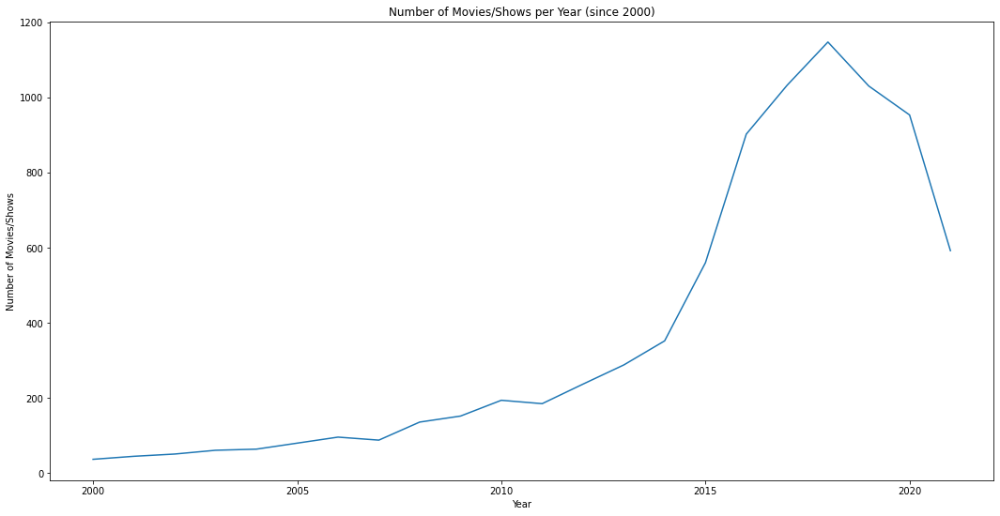

In [0]:
def plot_movies_per_year(netflix_single_genre):
    """
    Plots the number of movies and TV shows per year since 2000.

    Args:
    netflix_single_genre (DataFrame): A pandas DataFrame containing the Netflix titles data with single genres.

    Returns:
    None
    """
    # Remove duplicate rows based on 'show_id' column
    unique_titles = netflix_single_genre.drop_duplicates(subset=["show_id"])

    # Filter the dataset to only include movies and TV shows released since 2000
    movies_per_year = unique_titles[unique_titles["release_year"] >= 2000].groupby("release_year").size()

    # Create a figure with size 12x6 inches
    plt.figure(figsize=(18, 9))

    # Create a line plot of the number of movies and TV shows per year since 2000
    sns.lineplot(data=movies_per_year)

    # Add x-axis label
    plt.xlabel("Year")

    # Add y-axis label
    plt.ylabel("Number of Movies/Shows")

    # Add title to the plot
    plt.title("Number of Movies/Shows per Year (since 2000)")

    # Show the plot
    plt.show()

# Function call
plot_movies_per_year(netflix_single_genre)


In [0]:
#Task 3.2 - Find the top-30 productive directors. The productivity of a director is measured by the number of movies/shows. Visualize the top-30 productive directors and their number of movies/shows with a barplot.

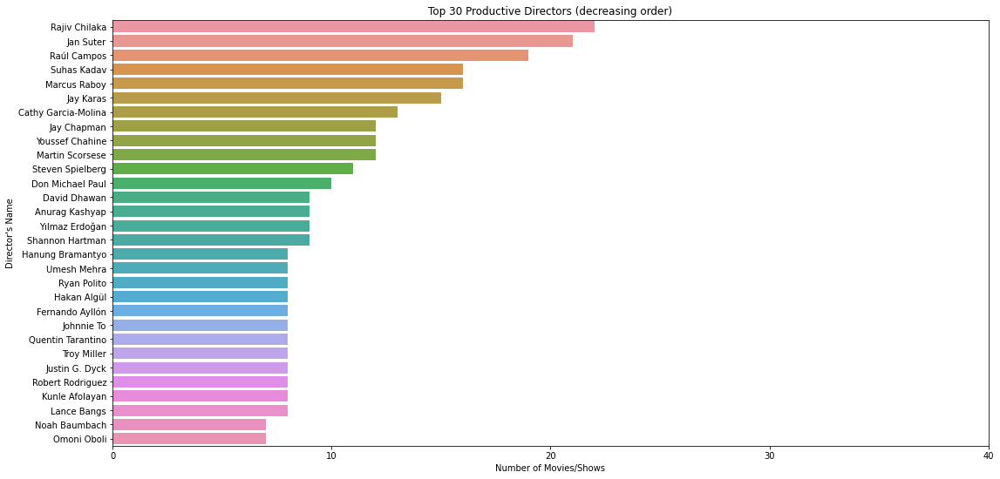

In [0]:
def plot_top_directors(netflix_single_genre):
    """
    Plot a bar chart showing the top 30 directors in the Netflix dataset
    based on the number of movies/shows they have directed, including collaborations.

    Args:
    netflix_single_genre (pandas.DataFrame): DataFrame containing the Netflix dataset.

    Returns:
    None.
    """
    
    # Remove duplicate rows based on 'show_id' column
    director_counts = netflix_single_genre.drop_duplicates(subset=["show_id"])
    
    # Create a new DataFrame based on the number of movies/shows per director
    director_counts = director_counts['director'].str.split(',').explode().str.strip().value_counts()

    # Take the top 30 directors
    top_directors = director_counts.head(30)

    # Sort the top_directors Series by values (counts) in descending order
    top_directors = top_directors.sort_values(ascending=False)

    # Plot a bar chart showing the number of movies/shows for each director
    plt.figure(figsize=(18, 9))
    ax = sns.barplot(x=top_directors.values, y=top_directors.index)
    plt.xlabel("Number of Movies/Shows")
    plt.ylabel("Director's Name")
    plt.title("Top 30 Productive Directors (decreasing order)")

    # Set x-axis scale interval to 10 and limits
    interval = 10
    max_value = max(top_directors.values)
    upper_limit = math.ceil(max_value / interval) * interval + interval
    ax.xaxis.set_major_locator(ticker.MultipleLocator(interval))
    ax.set_xlim(0, upper_limit)

    plt.show()

# Function call
plot_top_directors(netflix_single_genre)


In [0]:
#Task 3.3 - Make a lineplot that shows the average movie length and 95% confidence interval for every year since 2000. (x-axis is the year, y-axis is the length in minutes)

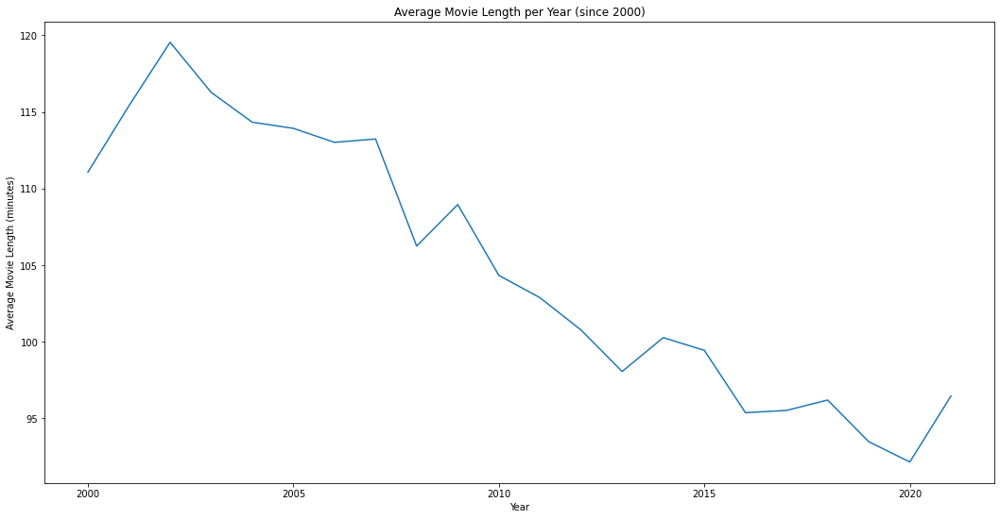

In [0]:
def plot_average_movie_length(netflix_single_genre):
    """
    Plots the average movie length and 95% confidence interval for every year since 2000.

    Parameters:
    netflix_single_genre (DataFrame): The Netflix dataset.

    Returns:
    None.
    """
    # Remove duplicate rows based on 'show_id' column
    unique_titles = netflix_single_genre.drop_duplicates(subset=["show_id"])

    # Filter the dataset to only contain movies released since 2000
    movies = unique_titles[unique_titles["type"] == "Movie"]
    movies = movies[movies["release_year"] >= 2000]

    # Fix missing duration values in the movies dataset
    movies = fix_missing_duration(movies)

    # Extract the numeric duration values from the "duration" column
    movies["duration"] = movies["duration"].str.extract("(\d+)").astype(int)

    # Calculate the average duration for each year since 2000
    average_duration = movies.groupby("release_year")["duration"].mean()

    # Plot the average movie length per year
    plt.figure(figsize=(18, 9))
    sns.lineplot(data=average_duration, ci=95)
    plt.xlabel("Year")
    plt.ylabel("Average Movie Length (minutes)")
    plt.title("Average Movie Length per Year (since 2000)")
    plt.show()

# Function call
plot_average_movie_length(netflix_single_genre)


In [0]:
#Task 3.4 - Make a lineplot that shows the number of movies/shows produced every year since 2000 in each of the following countries (United States, India, United Kingdom, Japan, South Korea) respectively. (x-axis is the year, y-axis is the number of products, and each country has a line). Make sure that you add the legend.

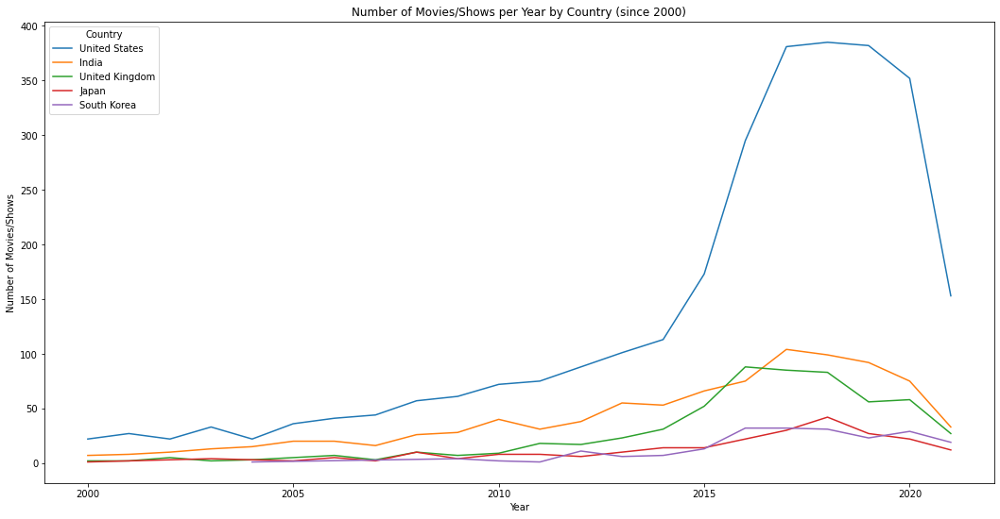

In [0]:
def plot_movies_by_country(netflix_single_genre, countries=["United States", "India", "United Kingdom", "Japan", "South Korea"]):
    """
    Plots the number of movies/shows per year by country for a given set of countries.

    Parameters:
    netflix_data (pd.DataFrame): DataFrame containing Netflix data
    countries (list): List of countries to plot

    Returns:
    None
    """
    # Remove duplicate rows based on 'show_id' column
    unique_titles = netflix_single_genre.drop_duplicates(subset=["show_id"])

    filtered_data = unique_titles[unique_titles["country"].isin(countries)]

    # Group data by country and count number of movies/shows
    grouped_data = filtered_data[filtered_data["release_year"] >= 2000].groupby(["country"]).size().reset_index(name='count')

    # Sort data by count
    grouped_data = grouped_data.sort_values(by=['count'], ascending=False)

    # Update the order of countries based on count
    countries = list(grouped_data['country'])

    plt.figure(figsize=(18, 9))
    sns.lineplot(x="release_year", y="count", hue="country", data=filtered_data[filtered_data["release_year"] >= 2000].groupby(["release_year", "country"]).size().reset_index(name='count'), hue_order=countries)
    plt.xlabel("Year")
    plt.ylabel("Number of Movies/Shows")
    plt.title("Number of Movies/Shows per Year by Country (since 2000)")
    plt.legend(title="Country")
    plt.show()

# Function call
plot_movies_by_country(netflix_single_genre)


In [0]:
#Task 3.5 - Find all the countries that produced more than 50 movies/shows in history. Make a mapplot where each country is plotted on the map as a circle and annotated. The circle size is based on the number of movies/shows it produced

<command-350348950849444>:13: FutureWarning:

The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.



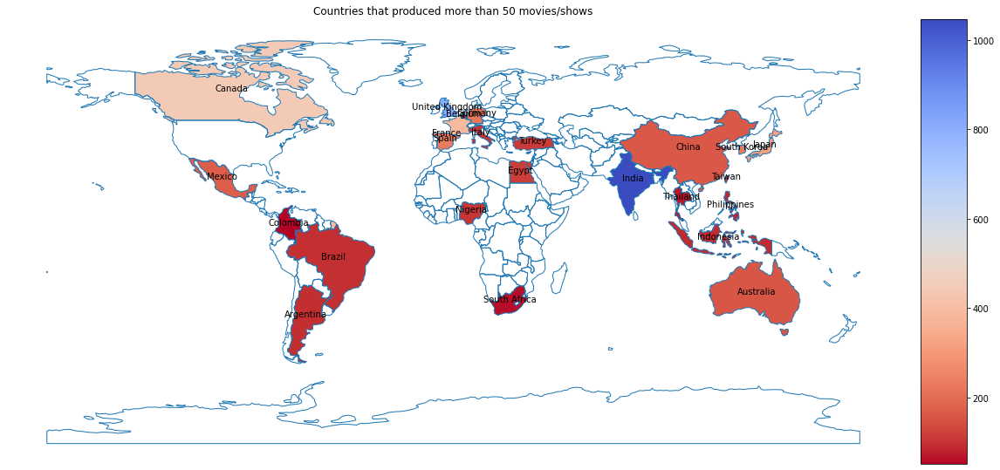

In [0]:
def plot_countries_with_more_than_50_movies(netflix_single_genre):
    """
    Plots a choropleth map of the countries that produced more than 50 movies/shows according to the given Netflix dataset, avoiding duplicates.

    Args:
    - netflix_single_genre: pandas DataFrame containing the Netflix dataset.

    Returns:
    - None.
    """

    # Load the world shapefile using Geopandas
    world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

    # Remove duplicate rows based on 'show_id' and 'country' columns
    unique_countries = netflix_single_genre.drop_duplicates(subset=["show_id", "country"])

    # Count the number of movies/shows produced by each country
    country_counts = unique_countries["country"].value_counts().reset_index(name='count')
    country_counts.columns = ["country", "count"]

    # Filter countries with more than 50 movies/shows
    filtered_countries = country_counts[country_counts["count"] > 50]

    # Merge the world shapefile with the filtered_countries DataFrame
    merged_data = world.merge(filtered_countries, left_on="name", right_on="country")

    # Create the plot
    fig, ax = plt.subplots(1, 1, figsize=(20, 12))
    divider = make_axes_locatable(ax)
    cax = divider.append_axes("right", size="5%", pad=0.1)

    # Plot the world boundary and the countries with more than 50 movies/shows
    world.boundary.plot(ax=ax, linewidth=1)
    merged_data.plot(column='count', ax=ax, legend=True, cax=cax, cmap='coolwarm_r', markersize=merged_data['count'])

    # Annotate country names
    merged_data.apply(lambda x: ax.annotate(text=x['country'], xy=x.geometry.centroid.coords[0], horizontalalignment='center'), axis=1)

    # Set title and remove axis
    ax.set_title('Countries that produced more than 50 movies/shows')
    ax.set_axis_off()
    plt.show()

# Function call
plot_countries_with_more_than_50_movies(netflix_single_genre)
